In [40]:
import os

os.environ["KERAS_BACKEND"] = 'jax'

import json
import math
import numpy as np

import keras
from keras import losses
# from keras.backend import ops
from keras import optimizers
from keras.optimizers import schedules

import keras_cv

import tensorflow as tf
import tensorflow_datasets as tfds

In [41]:
pip install ops

Note: you may need to restart the kernel to use updated packages.


In [42]:
classifier = keras_cv.models.ImageClassifier.from_preset(
    "efficientnetv2_b0_imagenet_classifier"
)

Attaching 'config.json' from model 'keras/efficientnetv2/keras/efficientnetv2_b0_imagenet_classifier/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/efficientnetv2/keras/efficientnetv2_b0_imagenet_classifier/2' to your Kaggle notebook...
Attaching 'model.weights.h5' from model 'keras/efficientnetv2/keras/efficientnetv2_b0_imagenet_classifier/2' to your Kaggle notebook...
/opt/conda/lib/python3.10/site-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/opt/conda/lib/python3.10/site-packages/keras_cv/src/models/task.py:43: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/o

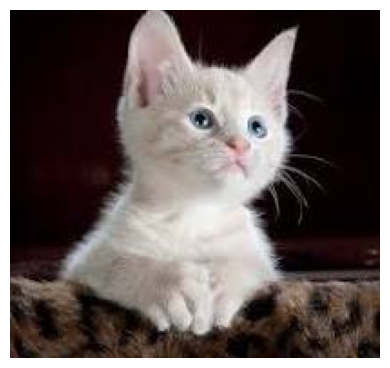

In [43]:
filepath = keras.utils.get_file(origin="data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBwgHBgkIBwgKCgkLDRYPDQwMDRsUFRAWIB0iIiAdHx8kKDQsJCYxJx8fLT0tMTU3Ojo6Iys/RD84QzQ5OjcBCgoKDQwNGg8PGjclHyU3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3Nzc3N//AABEIAMAAzAMBIgACEQEDEQH/xAAcAAABBQEBAQAAAAAAAAAAAAABAAIDBAUGBwj/xAA6EAACAQMDAgMFBgUFAAMBAAABAgMABBEFEiExQQYTUSJhcYGRBxQyQrHBI1Kh0fAVM2Lh8SQlghb/xAAYAQEBAQEBAAAAAAAAAAAAAAABAAIDBP/EAB4RAQEAAgMBAQEBAAAAAAAAAAABAhESITFBUQMi/9oADAMBAAIRAxEAPwDw6jSpUNFSpUaiQpYo0amtAKNIUQKDE1lazXt1HbW43SyMFQepr2zwn4ch0Sx2Re1PIQ0jkc5x0Hurlvsm0ET+dq0q5xmKLI6epr0xv4TeyORxUvWXr3h2z8QWZtr1AJT/ALM4HtI3bn0rwzWNNm0m+ezuQQ6Y6jGf8OR8q+jomDkbq8/+2DRFlsoNYjj9tMRzN6+n71bE3K8kxQp3rRcbTj4VOlMoUaNQNptPNADJqZsNxSC5rp/Cvg3UPELCWNPLsxnM7cDPTA9/FdL4j8Fab4b8NT3yyG5uVwgZuzHjp9aWHmeMUqXalUSoUaFQKjQo1IKVKjUipUqIqJCjSAo4oaICiKVEKTwAflU099+zi2Fr4Js2AwZE3n37ua2ZiDVDw4v3PwrZ25zmO3Xg9eBUqzeap4waqsYesm1wc1Nqumxa/o1zp0n4Z04Pow6U23tWl9piF9M96tWz7CrADKtg4rMiy0+abm2ltrqWGZSJInKMCMcim3S4mcD8px/SvZftG8D/AOqahFqunKFE+fvGOzcDP715rrnh6+tdQZBCxJkC4x3OK0JXPYpVoz6Rdwl1aCTK4zxjqcDiqq2k5VW8p9rHAbFR6V8E9q7LwF4Lk8QTi6u90enxN7R6GU/yipfBHgS5166WS8V4rNWy56bgDyP1r260sYLG3itbSJY4YxhEXoBUzUVpZQ21ukNvEscUa4VF4Arzn7Y5vL0uztl4M0xZgPRR/evVzGoO0Z6c14X9sd753iKO2TO23hAJzwSTmllwDEdqFI0qkVCjTahRpUKVQEUaVGpqEBRHWgKNDUOpUhSFRKrujwfedUtYcZ3yiqeK2vCUXma7bD2cBs8io+PabaUtYttH+0MY9wqhp1yzq6FslDijc+Zb6G3k/wC6w3H31leHJiRISc1n61h46uC6k+7uhywTmrNsyCMSrxG/OPQise0mKXEgcFcjIJHBx2/f5Vcg2RmSONsLyQPT3frS55XtuW9wGhMbEbTz+1CO3tjtk8tM57jJrMjlXIXkr7uwwf8Ar6VLNPJAImb2gw5YdM0cmWxPYWdzCxltonPGcqOf8yayf/5DS3KNbQrGBk+WRwDW5bEtCmMEE8H1FPil2zYIrWwq2FpFYQ+RFGEx6VMBg9KtyR+Yu/vniqdwpK4zgd81I1Tu3OQR6V84faLdR3fi+/eLlVfZk+oFfQrSln8uLKqoOM/Cvm3V7RW1O7Ml5D5pmcsvIwSSetaOtMc0KsyWksalgFkXs8Z3Cq9AChRoGkUqVKlUDhTqAoih0hCjilRoaKiKVKpoRXof2Y2arBeXjqCR7CkivPV7V6P9nsif6bcREuJFfnjj5Uxn+njrLwmSwVF5cryKx9CtLq2kme4Ty4yfZBPNbkQ46CnyZ6qRmud/WcctTQ7mcjABC8jBp2SMDB9BUcUqQ+0wDGr1rMl1MqOQoP8ANUU1lEu0yXLFVHQ4q+n3DULX7pbXyGZQSqMcN8h3rm/HWm6lb2v/ANY5d50CQliNqsTz146Y6++uB0mXUbbRotUupVUNc+VHziQ465Hu7GuvDpy596e6xgWNvBAxyyjbVmNA0+ccVzNjqq6jpMd1I/8AGXCt8f8Auui0qbzGA7gZyaxo+L8qewoCnG7FVLlAwxgnHas/xp4si8ORJ5jKgKB2ZlLYySAAO54NSeH9Zi12xS5hdJEcZDoMAit8KJl2pKVmmkt8OwYEM3avnbxPp7W+q3rRlSgmbPYgZ9O494+eK+l7qAQTNcOcIik+4CvmXxBqEk+vXtwhUK8zHaDxjNU8b3ushJGjYlCV9cHrRkkMnLAbvXHWlJgtuVdqnnHpTKFo00KdQqZ0FKjSqR1EUBRFTpBpUhRoaEUqXalUTh1xXaeApSJ2jDIAV555NcUASeK3/Cl5Lb3iBH4JwVOMVDLx6tG4HA/SmvLjJ9KZCQyA9SaJRGYB8ZrFc8YmsovMLvnPfFXkjBYMDsPpVaOeOBelBb4yNtEZI+BoP10lvcRSWn3a8CvG3VW7/CsLVtD0jLNbWTSzD8I8wsFPwpqmZyAUO3PAPp8a0YzIU2xkRseM/ircyZsm2DpqS2cxM24Bmyw9Pl3NdRpGoRPKAjFivDGoGso7yDypyw3DaJNpyPn61n6Vpt7ol66Tsk1u/wCB9uG696LbHXD+czavjTw0PE9sEzklAAR/xJI/qTxQ8IaS9hfiC2smtbREPm7UKR7sflB56jNbOkGUedJOMQleFHrnrWi53KDubb2Brtz/AMvPf5zHJFqECXNrPC5yGQjHur5k8baGdL1uSOKPaj5PJyBX03PKsMDu7BQE6mvnX7TLuOfVGUSxdc4jzz8c0Twz1xTkdF5A7+tR0gaRrLZUKJoVAqVKlUhp6imVIhqahYp2OKBIog8Vl1ICnBOaCkZqxGQW6dqkhZCvUYqzpm8XSMhxg9cdKdJtMRyOan0V5Y7qMxxbgegIyGqgy8ekeHp2a2CkkgHq3WtwQgjgfOsjR8NalzGEY4GMYrdtlyBjmiuMQi3XoSc++kkc3mcEFPQVoeUGHFBYihrOm9mhQoy4PwzVuz3MoUE7c5UA9aj2BlwaYV8v8DEHvWpWGrOVtgo5DN0G45NQ3M1wIopRDuRT7eeTj1xT9PWKTA5Zj1LVvR2sIzleMdK23jnMVOyuEnt1MbZU9OMVfLBYB1JHNVLOyNqz4x5e4lfhU11KkEJlkOFHelzyu7tleKtR8vTXSPBlYZ2F9pI+dfO3iC41OK9kkY3cEZPAY8fUcV6T421q01C5lgF1CJC22Iu2VJx0I7Zrza+lvdNkPkvItvn2oZPbVT6c/lPY/uKlGSb64b/ccOP+aK36ig8sMgy0Aib+eLIz/wDknH0q3IlpdokkWLabO1oyf4ZPXg/l/Ss+aN4pGSRSrKcFW6igkyAcqQw9RUdEHFA4qJUKNCoDThUdOFRlPNIU2iKG9nU4MfWm0V69M1NbWrSCS5kChiik8tg8V3/hHQ7mIsJIY5Yn53JyD8ay/B+kzzYkeHfEeQysRXqdnbpYWQSNWZ3Hc5KjsKZPrjnkzb0CNVhUYCj1p9ozYAXmrL2K3L8n2/5TxU0OmmJhgYP/ACFYvpiWLoKsqm5R391SRWnAwM/AVdigChQRzQrVBbfceBUwsmbqtbVvaKcZAq8lmvrW5GbWJY2QjbJrUVsdanaBY/8Aqo9hYEDj3ntSz6rX16ltEXkZQB2J61494/8AHEy3ItY03WoPtKDgsO4roPtJsNce2cRAlDkq6AkEe/0rw+9S6jZluHZsHuxP60tSRb8RJtvRKsnmxToJVY98jBPxPX547VLa3wv7f7teEMwGN7en83xHf6+tUbqQy6TZ5OTC7x/I4YfqapQyGKQSL1XkUFJIrQO8b5yD9fSk0xkjVZDkoMKe+PSptRmSUKu0iSJmXd/Mucj6c/WqVSGgaVKpCKFKlUgFOFNFGkQ6iDTaI5oalOzVrT7WS6uVji6k9arxxNIwC5OTjgZx9K9R8FeEIVVLiYCY/i4OKZ2rlpr+ENJksLdGPXHUZroZX8x/aU/OpnjihiEUPskDgVCqsXG9PoaL05zuteyto5VU7sN1BPWr6qkZG8jP1zWTa7ogNrNn0zWzbSpMNsgGffWGgnMjJiFVHvo2Nk4YNKct3FSCLByrHaOhFWIpNqknrUVtFA6VKuarJKFjbPJqMXoHAzn0rW2dLTkd6heUDocVE7PJ0GPnSWHu5zQ14g1lPP0tyyqwXJ9oZxXzn46szHeO4uHMS9I8AIvwA4r6biVcFeoPavIftb8NJNA93AqiZeo243fOunxnyvFZJP4SxjoDk/H/AMpkIVpUV22oSAzeg70WiYHlSPUe+hsYdqy1qjcSCWeSQDAdiwHpk1HT/LY0vKb0qPGmUqf5TelHymq2uNR0qkELUfIara40BGKesQI61bitQT7TEj3CpUtU5Hf3+lDckUfIHrUsNmZJAihiT0qfbGMeywGcZzXSeFLG2lvVdk34IwWzkGpWyR0fgnwtJHiaeIFOu2Ra7ieS3sIfLtkC85IFN+9x2VuIVyxPJ5rHuLkSyMSTg9q3ldTUcPb2sG5YvvYj3c5q5DexuAXHI65rEMyjgc/GmwmQMGZva7YzwPlXLbcjsbeW3ZQEmAY9jV1JMYHDD3VyMcjFDkkn1zzU9pPIj/iK/OrZ4uwS4EYGSCp6VOJEKAZ71zH+psoHOfSrFrdSTzEN39KtjVbxcFeG59KaJ49vQbqrvbM8WUkKn31Se0njZXeU7fcKQ2kuVombPQ1ixxsx4NXoxx1NWzpfSYDvVDxBFDc2L+bGGUg8HHFE7loNIssTQycqRjFblZyn184+K4ja6pJG8UgHYFQP2rCaZM4xXbfaVGba8eK1j8pVOHKx9fQZx+hArgC27qOari3M+lnzVzgUS4qp34pwz6H6Uahmf6s5PaiTgZNVwX/lb6U7MhGNjH5Uab5xbhRXIDSBM9zU01skchUTxvjHtKeDVa3ZFz58EjemKIdvywEDsNtGluOwt9Dtp1IhvVcFcgggFflVHU/CurQe1AEuUAHKnaT9f70zTUuLa7Wbyy6BuVVuox+tdPFqAL+WtwI+OA/X6/OjdG3HJoerHGy2Zx3UjDL8c/tXX+H4LnS4N91EMAZOKmjvUZ95ucc8rxg/3qdrkP1Zgh9RkGs86uJPrEU04DPs7e0cYq5AUnjyjZOexzXEeJppLWXewyjZwwHWqOm+Ijb3AcSsFOAwOcUzdYykj0OZSCFIHvq1EpVegOffxWVYapbXSB1dGbHTdWnHOhA2nr6UiLK8EdgOoo+ZkMR07VX3gYC5yTzR3BT8KGoHnuH4z1/rWrpk8rTqg4+NULYRyMB056+nFdBb2ZFuJoVBYDO0j61FtxrJ5WVO7A6Urt//AIOHLIMjnH1qtp98k65Bxjgj0q9LGLuEwuPZIzmtRi+s+0IbOwkqeFb1q8nFVI5kRxbwDIXqatchc4o0amcArnpWPeXsVsx8wnjnIHpVDXdejsYmJfBXse9ebav4yWeOZLlt6kY9njFOxMd912HiKWz1SJvLUSMOD2wfmK4t9FVuI7SMt6DH6in+GJJ58TNIEi/Dg9enFdGDbo4UjaTyCB1OKMs7G5hHKXeiTQW6zpYh1I5C4yD8zVRbK6OANKkXdwDgYzXSeILprONmXIDggqa5mO5e4tnYtIjR5Y7WzxVMtqyTpdfRNRKB4NPjlH8qyLn+tZ8kV/EyrLpbR5PUsDj44zW1azvFGv8AEY7sHeBkN8R2pXd8Y0O7HtZyp+FXI3FlmzvGhLxWqsPXcOB8P86VEbS9jOJUtkPoXHStGFh5ZaMBQRnb6UBMzgbtpI455o5xca5WzvDb3Txuz8H2TnlWz3FW9bnlkj80ReWycnbnHPeqt3bb5hcqOH4fHdqNwkn3UMpO3GCpPBp3KJjVTTb8RNtlXzAT0J/zFdXbasGgGzainjaw/D864bJSYNjaQa6O0ukS3DGMN3OB1+NGcWFWtUeF7d0mBJIyNrZH9K5SGJGcq7Fc9MVuXl0Wh8tVTB4BI6fOseAeVPtmGAeh/tTjehlO0kkL22GjdvcRWnpXiK8tG/igyLx+I9KltUW4VUZgoJyM9MVQvEVXdWBVlJBHSjkri7Cw8W207oCrDPc9c12GnrHee0r7l69eteGwM6yZQnnjIrsdA8Ry2dxFvY+Vg7hn+tNElelNbNaXCbsmJyPlyDXY2MiKgCkEY+Vc7ZT22paOLjzU5TcrMeDiqmha7DcBY0kJZTtYfA4z8KdDbU8h7TXTGqkI5LIR0IP9q6R8orY49nisa61CGa+gt7Zg0kalmPpnOBn+tWb2+EGmPNKeFHJ91MBtkFMh285bnmneJdWh0fTHnc/xNuI07saxNA1zTZI0drpOTjJOAD1xnp0Irk/GfiOG51aVZCskIAWMA5B9KLZGtWvPfFWuz6hePlmRNxyjNnJ9fh7q54sT+bI+FbWo2Uc1wrxllZ2/DjIUUjZwW6hFTzH6kntVymlwrX8LXDQwBDIFyfTpXQDWS1vHHJGGZXIEmeMenwP71xlrcmLDEEL6dM1F/qEn+po0b4GRu5OOexrlq5V13JHU6/cNdxR5OQVGwh8Z7CuWh+8wSiNIwgYgMC2e+P3rZjulleBZFwGJ/FnB9avy2qOxaKPljlR39M/Kty9aYs72mtBgIqjggHbjhfdnNYHiV5be59p2IbLKpPY/+1I+qmG9mDf7St7A/wCPvFZ2oT3Go3UckqcldinuVPSjHHRyu2zpkrzxpkjpz9Krz6gIZTG0iZGOgqzpsRhs1VhtZdwJHXH+CuQv2Ju5Pj61TGWq5WRpxXBjuvJf82BWixdFIUew/Q+tZeqIUuY7qPIz1PXBFWbfUt/8NlYg/mU859fjVcetnlq6qhdabP5pflwep75q5p9rJGMO+wc9+fh/WtSKNlTe8gIb83So5Zo0G2Rl4/CVFVtvQ1J2haGNkIm4U8/GsaeFbe4Ee4yI3X3VduLl5Q0YJKDo2OlVpNOdkD7yWIzg9MVY9LLts2sKm32gkMOV461R1YIACOGc5yPd/nSjYQTwqGWQY6AdvgR+9TzRLsjdotygHOOoOeaupT3Ybp1mJTG0oQ7+FdVxz7/71W1mFbcIsQzkD5f3rVWaNY0ZXVMdAOje41cktIDEs0iZDDdkY+OaJl3tcetMrTrvUoo7WE3c/lDDLFuwme2PfV+K/wDulxIbeR4wOEIbjtj59aryyAtbkMPZboD8qq3CgQjZ1GXJpuW6OM06G08RXWn3wurOZp2Y4ZJMkEZ/Wm+JfHGrapH93wsMY/EkXAPxrkYrny5PLlJxnJwamaRiCwXP8xp3ocZT7S7uAjb2ZFb8WOB8arXepmUDbwRzhuo+FSJIJkwhCueFyeP/ACsqWJ4vxA/HFOM36srrxZXUrhejZP5m9asQXwlBDr7R/MO1U7ZFaFtxwCaCDy3yD7P61WQY2p7udk/ho3Hup9jCrnEmGBHANVGAlO7PSpHldHATrgfOnXS+9t6W5htbOOI8r+JWHVD3B+PWrdnqcIto9yMeo3kY4/8AeKxS0V9EEclWxwvvqePT/IVJSxaJjyo7HpWddHa3dWnmXyyIAiDCHA5OSf2x9K0o7CK1mVypfeQwJOe4/sP60I8FNjbcleFB6mmX0rSKRE/twDcFByRxzWd/rWoqvfr5hCnGTgsTxnHSs2W0inbzGZcmsyKPfKCXJBGd2MYPpTpVuo328n0IFb4/jHLfr//Z")
image = keras.utils.load_img(filepath)
image = np.array(image)
keras_cv.visualization.plot_image_gallery(
    np.array([image]),rows=1,cols=1,value_range=(0,255),show=True,scale=4
)

In [44]:
predictions = classifier.predict(np.expand_dims(image,axis=0))

1/1 [==============================] - 2s 2s/step


In [45]:
top_classes = predictions[0].argsort(axis=-1)

In [46]:
classes = keras.utils.get_file(
    origin="https://gist.githubusercontent.com/LukeWood/62eebcd5c5c4a4d0e0b7845780f76d55/raw/fde63e5e4c09e2fa0a3436680f436bdcb8325aac/ImagenetClassnames.json"
)
with open(classes, "rb") as f:
    classes = json.load(f)

In [47]:
top_two = [classes[str(i)] for i in top_classes[-2:]]
print("Top two classes are:",top_two)

Top two classes are: ['lynx, catamount', 'Egyptian cat']


## Fine tuning a pretrained classifier

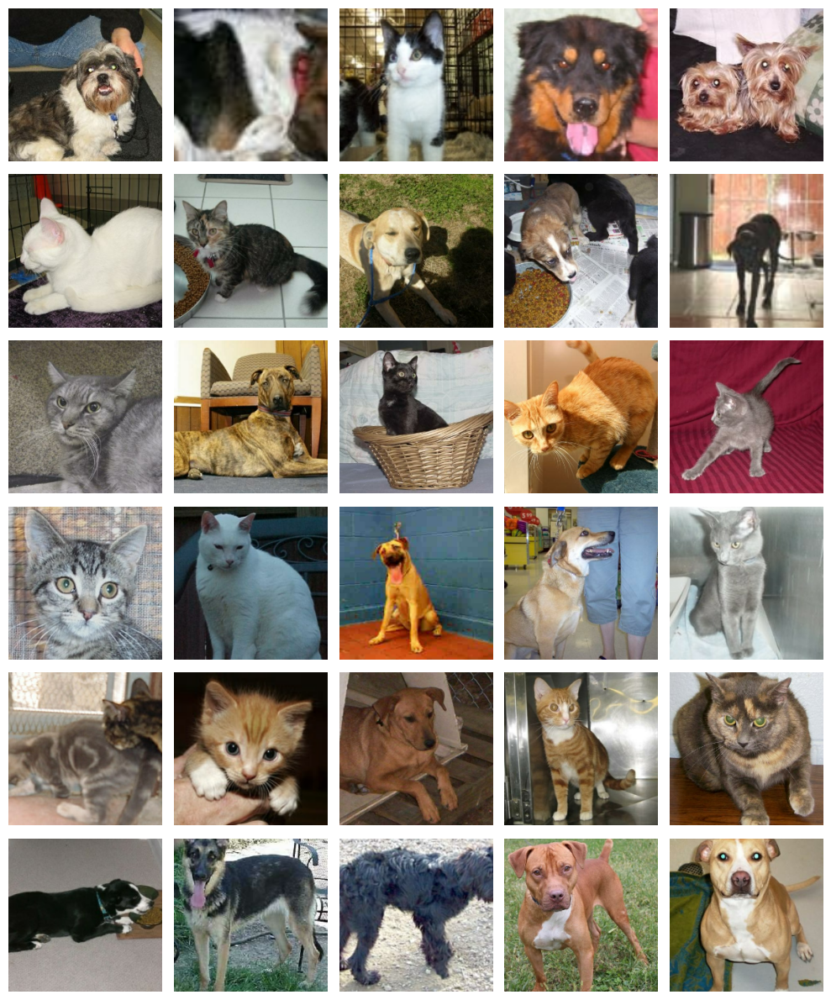

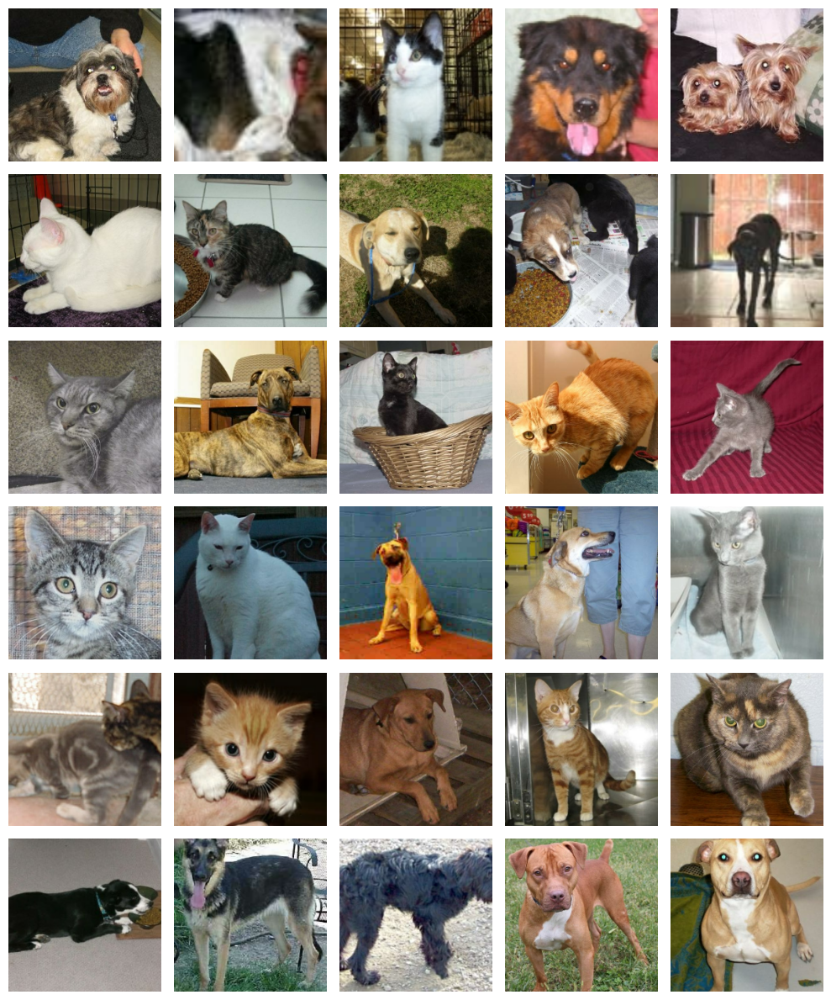

In [48]:
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)
AUTOTUNE = tf.data.AUTOTUNE
tfds.disable_progress_bar()

data, dataset_info = tfds.load("cats_vs_dogs", with_info=True, as_supervised=True)
train_steps_per_epoch = dataset_info.splits["train"].num_examples // BATCH_SIZE
train_dataset = data["train"]

num_classes = dataset_info.features["label"].num_classes

resizing = keras_cv.layers.Resizing(
    IMAGE_SIZE[0], IMAGE_SIZE[1], crop_to_aspect_ratio=True
)


def preprocess_inputs(image, label):
    image = tf.cast(image, tf.float32)
    # Staticly resize images as we only iterate the dataset once.
    return resizing(image), tf.one_hot(label, num_classes)


# Shuffle the dataset to increase diversity of batches.
# 10*BATCH_SIZE follows the assumption that bigger machines can handle bigger
# shuffle buffers.
train_dataset = train_dataset.shuffle(
    10 * BATCH_SIZE, reshuffle_each_iteration=True
).map(preprocess_inputs, num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)

images = next(iter(train_dataset.take(1)))[0]
keras_cv.visualization.plot_image_gallery(images, value_range=(0, 255))

In [49]:
model = keras_cv.models.ImageClassifier.from_preset(
    "efficientnetv2_b0_imagenet",num_classes=2
)

model.compile(
    loss="categorical_crossentropy",
    optimizer=keras.optimizers.SGD(learning_rate=0.01),
    metrics=["accuracy"]
)

Attaching 'config.json' from model 'keras/efficientnetv2/keras/efficientnetv2_b0_imagenet/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/efficientnetv2/keras/efficientnetv2_b0_imagenet/2' to your Kaggle notebook...
Attaching 'model.weights.h5' from model 'keras/efficientnetv2/keras/efficientnetv2_b0_imagenet/2' to your Kaggle notebook...


In [50]:
model.fit(train_dataset)

2024-02-16 14:44:46.241695: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inimage_classifier_1/efficient_net_v2b0_backbone/block2b_/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


727/727 [==============================] - 153s 180ms/step - loss: 0.2315 - accuracy: 0.9399


In [51]:
predictions=model.predict(np.expand_dims(image,axis=0))
classes = {0:"cat",1:"dog"}
print("Top class is :",classes[predictions[0].argmax()])

1/1 [==============================] - 2s 2s/step
Top class is : cat


In [52]:
NUM_CLASSES = 101
# Change epochs to 100~ to fully train.
EPOCHS = 1


def package_inputs(image, label):
    return {"images": image, "labels": tf.one_hot(label, NUM_CLASSES)}


train_ds, eval_ds = tfds.load(
    "caltech101", split=["train", "test"], as_supervised="true"
)
train_ds = train_ds.map(package_inputs, num_parallel_calls=tf.data.AUTOTUNE)
eval_ds = eval_ds.map(package_inputs, num_parallel_calls=tf.data.AUTOTUNE)

train_ds = train_ds.shuffle(BATCH_SIZE * 16)

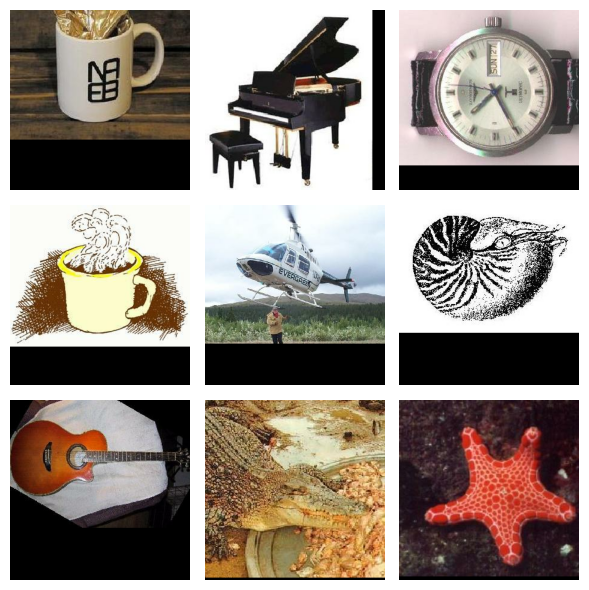

In [53]:
train_ds = train_ds.ragged_batch(BATCH_SIZE)
eval_ds = eval_ds.ragged_batch(BATCH_SIZE)

batch = next(iter(train_ds.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

keras_cv.visualization.plot_image_gallery(
    image_batch.to_tensor(),
    rows=3,
    cols=3,
    value_range=(0,255),
    show=True,
)

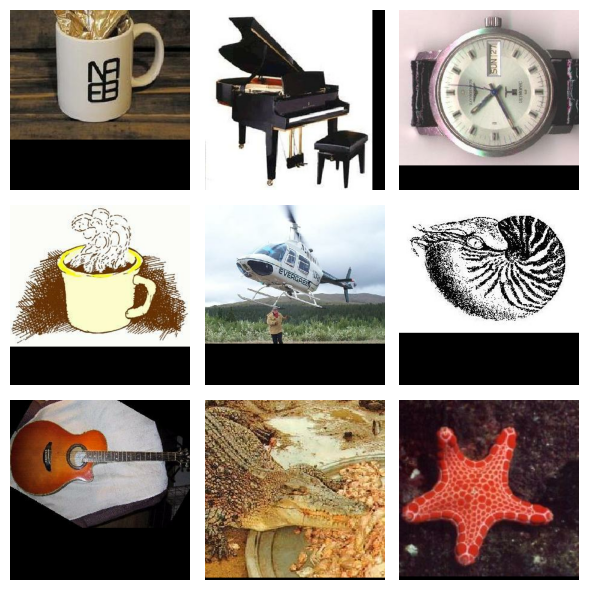

In [54]:
random_flip = keras_cv.layers.RandomFlip()
augmenter = [random_flip]

image_batch = random_flip(image_batch)

keras_cv.visualization.plot_image_gallery(
    image_batch.to_tensor(),
    rows=3,
    cols=3,
    value_range=(0,255),
    show=True,
)

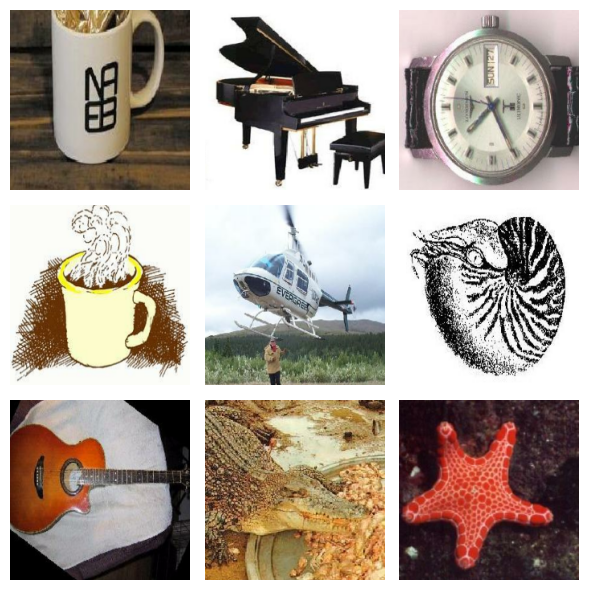

In [55]:
crop_and_resize = keras_cv.layers.RandomCropAndResize(
    target_size=IMAGE_SIZE,
    crop_area_factor=(0.8, 1.0),
    aspect_ratio_factor=(0.9, 1.1),
)
augmenter += [crop_and_resize]

image_batch = crop_and_resize(image_batch)
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

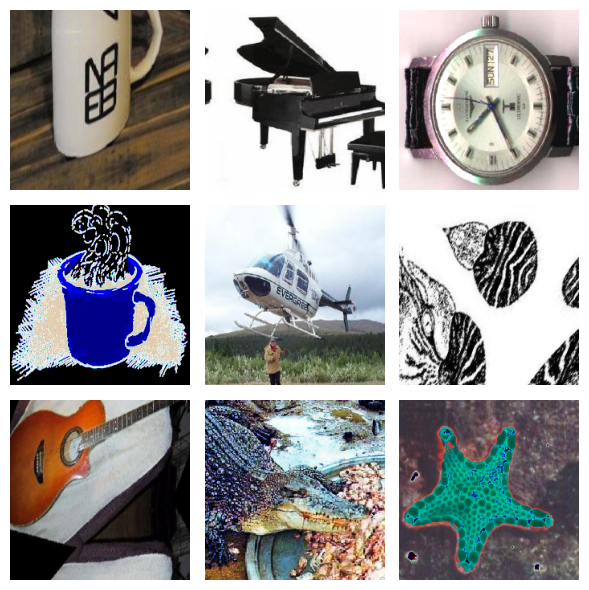

In [56]:
rand_augment = keras_cv.layers.RandAugment(
    augmentations_per_image=3,
    value_range=(0,255),
    magnitude=0.3,
    magnitude_stddev=0.2,
    rate=1.0,
)
augmenter += [rand_augment]

image_batch = rand_augment(image_batch)
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows = 3,
    cols=3,
    value_range=(0,255),
    show=True,
)

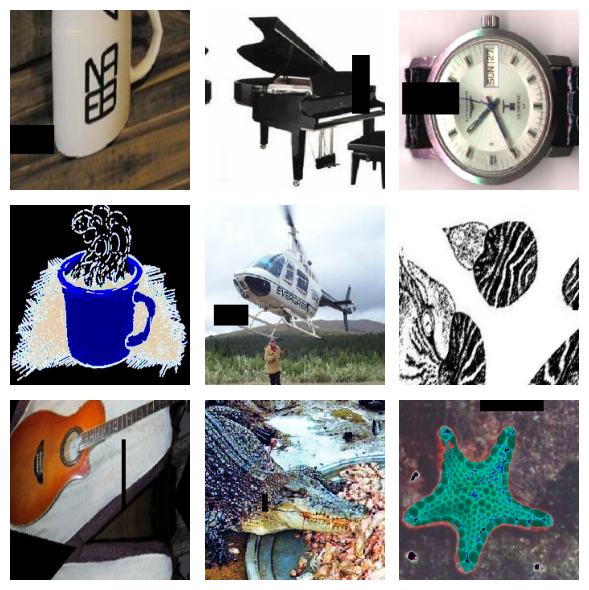

In [57]:
random_cutout = keras_cv.layers.RandomCutout(width_factor=0.4,height_factor=0.4)
keras_cv.visualization.plot_image_gallery(
    random_cutout(image_batch),
    rows =3,
    cols=3,
    value_range=(0,255),
    show=True,
)

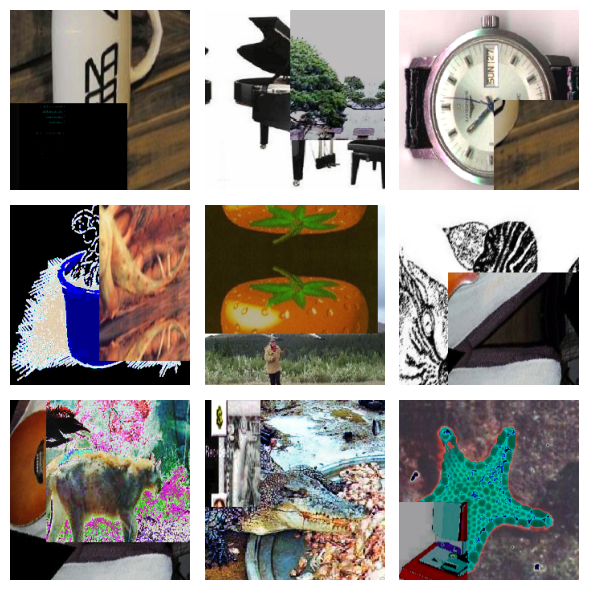

In [58]:
cut_mix = keras_cv.layers.CutMix()
# CutMix needs to modify both images and labels
inputs = {"images": image_batch, "labels": label_batch}

keras_cv.visualization.plot_image_gallery(
    cut_mix(inputs)["images"],
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

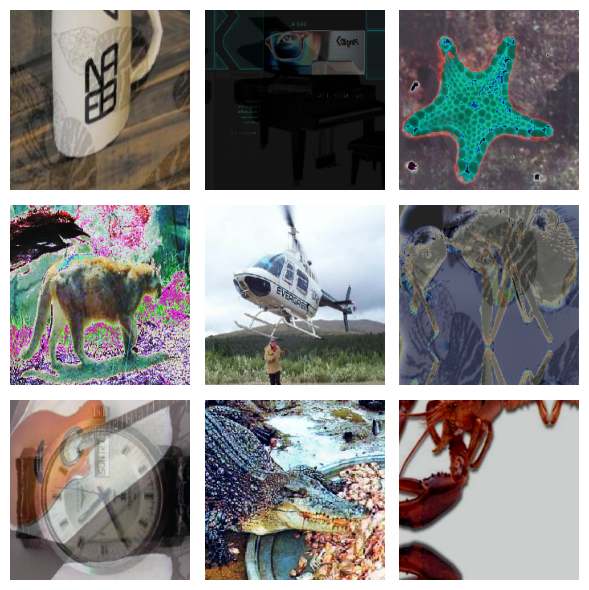

In [59]:
mix_up = keras_cv.layers.MixUp()

# mixup needs to modify both images and labels
inputs = {"images":image_batch,"labels":label_batch}

keras_cv.visualization.plot_image_gallery(
    mix_up(inputs)["images"],
    rows=3,
    cols=3,
    value_range=(0,255),
    show=True,
)

In [60]:
cut_mix_or_mix_up = keras_cv.layers.RandomChoice([cut_mix, mix_up], batchwise=True)
augmenter += [cut_mix_or_mix_up]

In [62]:
# def create_augmenter_fn(augmenter):
#     def augmenter_fn(inputs):
#         for augmenter in augmenter:
#             inputs=augmenter(inputs)
#         return inputs
#     return augmenter_fn


# augmenter_fn = create_augmenter_fn(augmenter)
# train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf.data.AUTOTUNE)

# image_batch = next(iter(train_ds,take(1)))["images"]
# keras_cv.visualization.plot_image_gallery(
#     image_batch,
#     rows=3,
#     cols=3,
#     value_range=(0,255),
#     show=True,
# )

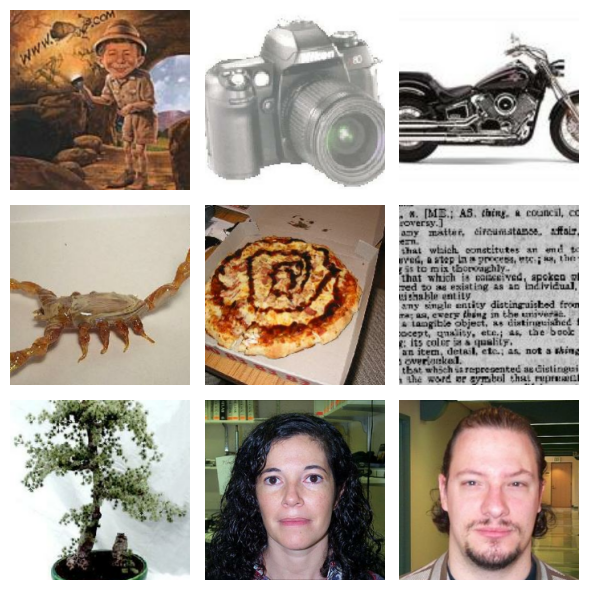

In [63]:
inference_resizing = keras_cv.layers.Resizing(
    IMAGE_SIZE[0], IMAGE_SIZE[1], crop_to_aspect_ratio=True
)
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf.data.AUTOTUNE)

image_batch = next(iter(eval_ds.take(1)))["images"]
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

In [64]:
def unpackage_dict (inputs):
    return inputs["images"],inputs["labels"]

train_ds = train_ds.map(unpackage_dict,num_parallel_calls=tf.data.AUTOTUNE)
eval_ds = eval_ds.map(unpackage_dict,num_parallel_calls=tf.data.AUTOTUNE)

In [71]:
def lr_warmup_cosine_decay(
    global_step,
    warmup_steps,
    hold=0,
    total_steps=0,
    start_lr=0.0,
    target_lr=1e-2,
):
    # Cosine decay
    learning_rate = (
        0.5
        * target_lr
        * (
            1
            + ops.cos(
                math.pi
                * ops.convert_to_tensor(
                    global_step - warmup_steps - hold, dtype="float32"
                )
                / ops.convert_to_tensor(
                    total_steps - warmup_steps - hold, dtype="float32"
                )
            )
        )
    )

    warmup_lr = target_lr * (global_step / warmup_steps)

    if hold > 0:
        learning_rate = ops.where(
            global_step > warmup_steps + hold, learning_rate, target_lr
        )

    learning_rate = ops.where(global_step < warmup_steps, warmup_lr, learning_rate)
    return learning_rate


class WarmUpCosineDecay(schedules.LearningRateSchedule):
    def __init__(self, warmup_steps, total_steps, hold, start_lr=0.0, target_lr=1e-2):
        super().__init__()
        self.start_lr = start_lr
        self.target_lr = target_lr
        self.warmup_steps = warmup_steps
        self.total_steps = total_steps
        self.hold = hold

    def __call__(self, step):
        lr = lr_warmup_cosine_decay(
            global_step=step,
            total_steps=self.total_steps,
            warmup_steps=self.warmup_steps,
            start_lr=self.start_lr,
            target_lr=self.target_lr,
            hold=self.hold,
        )

        return ops.where(step > self.total_steps, 0.0, lr)

In [72]:
total_images = 9000
total_steps = (total_images // BATCH_SIZE) * EPOCHS
warmup_steps = int(0.1 * total_steps)
hold_steps = int(0.45 * total_steps)
schedule = WarmUpCosineDecay(
    start_lr=0.05,
    target_lr=1e-2,
    warmup_steps=warmup_steps,
    total_steps=total_steps,
    hold=hold_steps,
)
optimizer = optimizers.SGD(
    weight_decay=5e-4,
    learning_rate=schedule,
    momentum=0.9,
)

NameError: name 'ops' is not defined

In [ ]:
model.compile(
    loss=loss,
    optimizer=optimizer,
    metrics=[
        metrics.CategoricalAccuracy(),
        metrics.TopKCategiricalAccuracy(k=5),
    ]
)